In [1]:
from IPython.display import HTML
from IPython.display import Image

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

# Stacking House Prices - Walkthrough to Top 5%

### Arun Godwin Patel

***

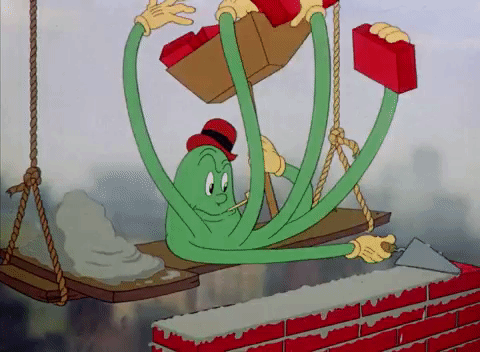

In [2]:
Image(filename='Images/stacking.gif.png', width = 800)

You may be thinking... **"What does a strange looking, 6 armed brick-layer have to do with predicting house prices?"**

Stick with it, all will be revealed throughout this walkthrough. But for now...

***

## Introduction

This kernel is intended to be a guide for education on the famous... Stacking technique. I used this technique to achieve a top 5% entry in the **House Prices: Advanced Regression Techniques** competition. I'll be focusing mainly on data preparation, feature engineering and the building of a stacking model. This is an ongoing project that I will update regularly, so stay tuned.

If you have any comments, thoughts or notice anything that could be improved, please feel free to comment.

Enjoy!

First of all I like to do some research on the project at hand, in this case House Prices. So **what characteristics help to boost the value of a house?**

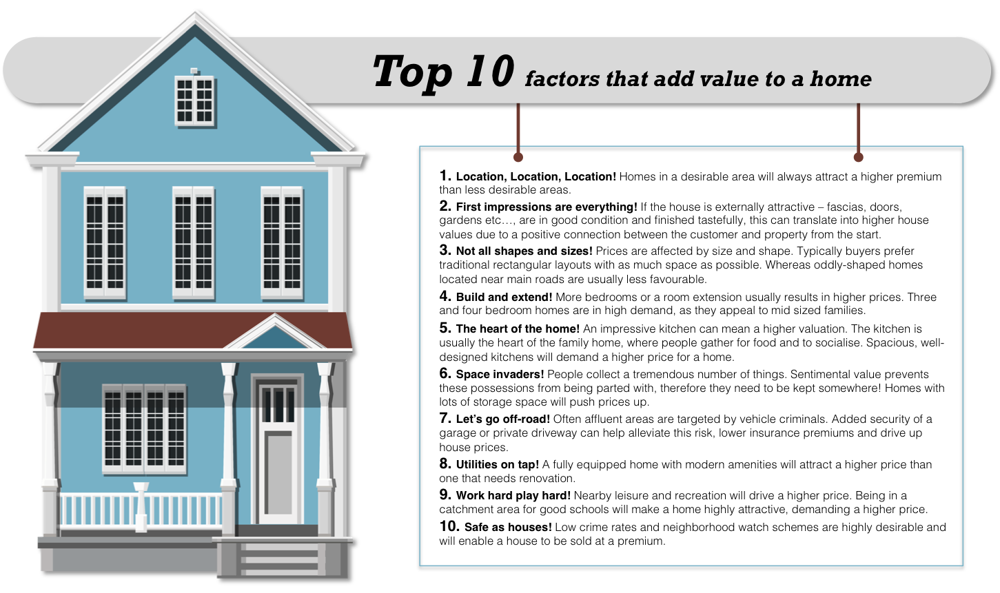

In [3]:
Image(filename='Images/top10.png')

From this research, there are several key things that stood out:
- Location - location is key for high valuations, therefore having a safe, well facilitated and well positioned house within a good neighbourhood, is also a large contributing factor.
- Size - The more space, rooms and land that the house contains, the higher the valuation.
- Features - the latest utilities and extras (such as a garage) ae highly desirable.

This insight will held guide my feature engineering.

***

## Content

1. **Import packages**
2. **Load data**
3. **Data preparation**
    - 3.1 - Remove outliers
    - 3.2 - Target variable
    - 3.3 - Treat missing values
    - 3.4 - Transform numeric features into categorical features
    - 3.5 - Label encoding
4. **Feature engineering**
    - 4.1 - Combinations
    - 4.2 - Polynomials
    - 4.3 - Treating skewed features
5. **Modeling**
6. **Conclusion**
    
    

***

# 1. 
## Import packages

In [4]:
# This first set of packages include Pandas, for data manipulation, numpy for mathematical computation and matplotlib & seaborn, for visualisation.
import pandas as pd
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style='white', context='notebook', palette='deep')
print('Data Manipulation, Mathematical Computation and Visualisation packages imported!')

# Statistical packages used for transformations
from scipy import stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
print('Statistical packages imported!')

# Metrics used for measuring the accuracy and performance of the models
#from sklearn import metrics
#from sklearn.metrics import mean_squared_error
print('Metrics packages imported!')

# Algorithms used for modeling
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
import xgboost as xgb
print('Algorithm packages imported!')

# Pipeline and scaling preprocessing will be used for models that are sensitive
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder
print('Pipeline and preprocessing packages imported!')

# Model selection packages used for sampling dataset and optimising parameters
from sklearn import model_selection
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
print('Model selection packages imported!')

# To ignore annoying warning
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)
warnings.filterwarnings("ignore", category=DeprecationWarning)
print('Deprecation warning will be ignored!')

Data Manipulation, Mathematical Computation and Visualisation packages imported!
Statistical packages imported!
Metrics packages imported!
Algorithm packages imported!
Pipeline and preprocessing packages imported!
Model selection packages imported!
Deprecation warning will be ignored!


***

# 2. 
## Load data

- The Pandas package helps us work with our datasets. We start by reading the training and test datasets into DataFrames.
- We want to save the 'Id' columns from both datasets for later use when preparing the submission data.
- But we can drop them from the training and test datasets as they are redundant.

In [5]:
train = pd.read_csv('/Users/Arun/Documents/Kaggle/House Prices - Advanced Regression Techniques/train.csv')
test = pd.read_csv('/Users/Arun/Documents/Kaggle/House Prices - Advanced Regression Techniques/test.csv')

# Save the 'Id' column
train_ID = train['Id']
test_ID = test['Id']

# Now drop the  'Id' column as it's redundant for modeling
train.drop("Id", axis = 1, inplace = True)
test.drop("Id", axis = 1, inplace = True)

print(train.shape)
print(test.shape)
train.head()

(1460, 80)
(1459, 79)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


- This dataset was constructed by **Dean De Cock** for use in Data Science education. It is viewed as a modern alternative to the Boston Housing dataset.
- As expressed within the competition, this datasets includes 79 descriptive features about the houses.
- A data description is included within competition, I highly recommend referring to this file frequently during data preparation and feature engineering.
- This file also gives guidance to how missing values should be treated, which I will address in section 3.3.

***

# 3. 
## Data preparation
### 3.1 - Remove outliers

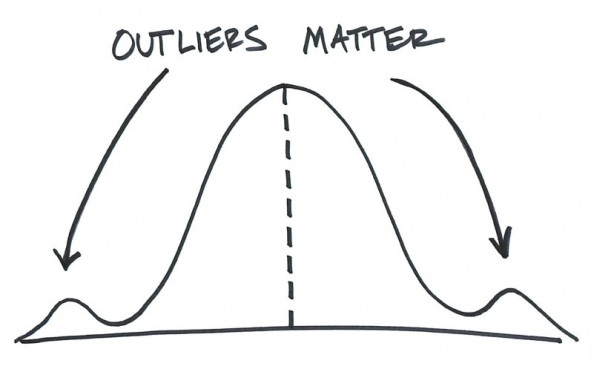

In [6]:
Image(filename='Images/Outliers-Matter.jpg', width = 700)

***Outliers can be a Data Scientists nightmare.*** 

- By definition, an outlier is something that is outside of the expected response. How far you're willing to consider something to be an outlier, is down to the individual and the problem.
- From this definition, this outlier will therefore sit way outside of the distribution of data points. Hence, this will skew the distribution of the data and potential calculations.
- Let's see how this will affect predictions of the future.

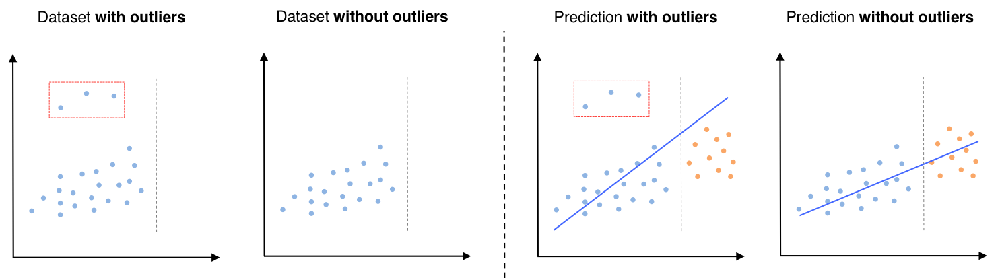

In [7]:
Image(filename='Images/outliers.png')

The **data points** are shown in **light blue** on the left hand side of the grey dashed line. The **orange points** represent the **true future values**, and the **solid dark blue line** shows the **prediction** from the data points. 

- When the outliers are left in the model, the **model overfits** and is sensitive to these points. Therefore, it predicts values much higher than the true future values. *This is what we want to avoid.*
- However, when outliers are removed, it **predicts much more accurately** with a generalised model that splits the distribution of the data points evenly.
- ***This is very important in Machine Learning because our goal is to create robust models that are able to generalise to future situations.*** If we create a model that is very sensitive and tuned to fit outliers, this will result in a model that over or underfits. If we can create models that are able to cancel out the distractions and noise of outliers, this is usually a better situation.

By referring to the **Ames Housing Dataset** link provided in the **Acknowledgements**, you'll see that the author outlines there are some outliers that must be treated: 

*" Although all known errors were corrected in the data, no observations have been removed due to unusual values and all final residential sales from the initial data set are included in the data presented with this article. There are five observations that an instructor may wish to remove from the data set before giving it to students (a plot of SALE PRICE versus GR LIV AREA will quickly indicate these points). Three of them are true outliers (Partial Sales that likely don’t represent actual market values) and two of them are simply unusual sales (very large houses priced relatively appropriately). I would recommend removing any houses with more than 4000 square feet from the data set (which eliminates these five unusual observations) before assigning it to students. "*

- First, let's plot the two features stated against one another, to identify the outliers. Then we will remove them. The chart on the left shows the data before removing the outliers, and the chart on the right shows after.

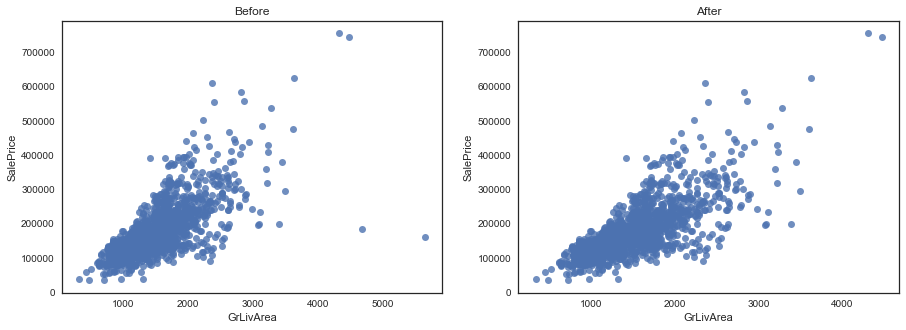

In [8]:
plt.subplots(figsize=(15, 5))

plt.subplot(1, 2, 1)
g = sns.regplot(x=train['GrLivArea'], y=train['SalePrice'], fit_reg=False).set_title("Before")

# Delete outliers
plt.subplot(1, 2, 2)                                                                                
train = train.drop(train[(train['GrLivArea']>4000) & (train['SalePrice']<300000)].index)
g = sns.regplot(x=train['GrLivArea'], y=train['SalePrice'], fit_reg=False).set_title("After")

***

### 3.2 - Target variable

- Unlike classification, **in regression we are predicting a continuous number**. Hence, the prediction could be any number along the real number line.
- Therefore, it is always useful to check the distribution of the target variable, and indeed all numeric variables, when building a regression model. Machine Learning algorithms work well with features that are **normally distributed**, a distribution that is symmetric and has a characteristic bell shape. If features are not normally distributed, you can transform them using clever statistical methods.
- First, let's check the target variable.

/Users/Arun/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


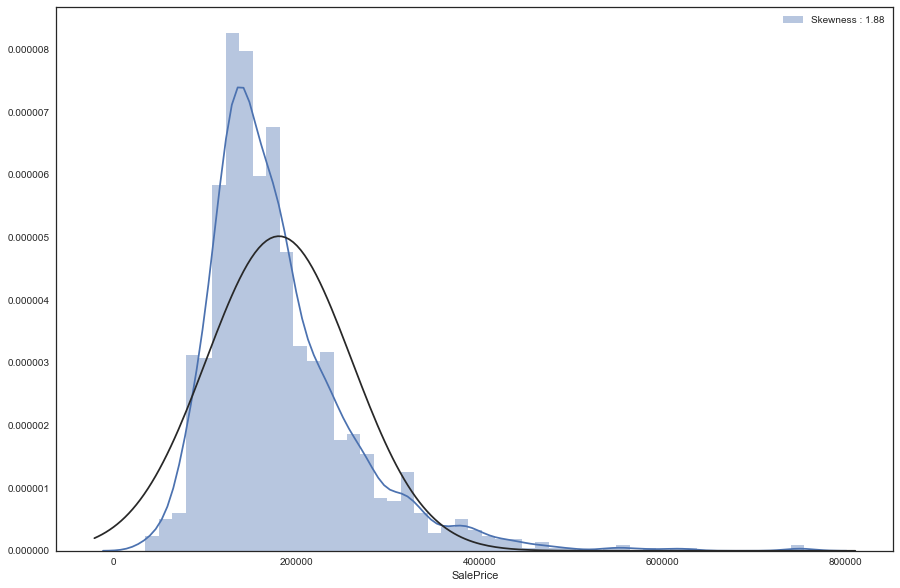

In [9]:
plt.subplots(figsize=(15, 10))
g = sns.distplot(train['SalePrice'], fit=norm, label = "Skewness : %.2f"%(train['SalePrice'].skew()));
g = g.legend(loc="best")

The distribution of the target variable is **positively skewed**, meaning that the mode is always less than the mean and median. 

- In order to transform this variable into a distribution that looks closer to the black line shown above, we can use the **numpy function log1p** which applies log(1+x) to all elements within the feature.

/Users/Arun/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


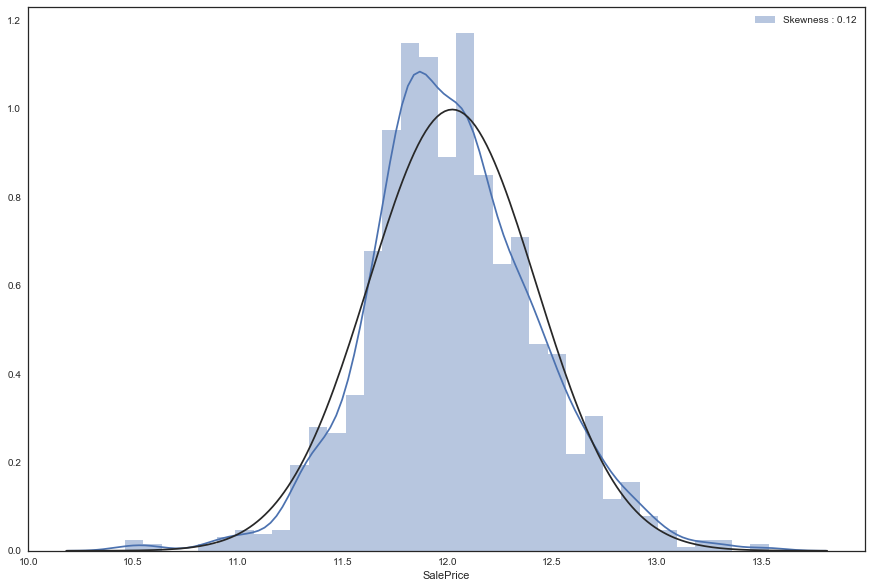

In [10]:
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
train["SalePrice"] = np.log1p(train["SalePrice"])

#Check the new distribution 
plt.subplots(figsize=(15, 10))
g = sns.distplot(train['SalePrice'], fit=norm, label = "Skewness : %.2f"%(train['SalePrice'].skew()));
g = g.legend(loc="best")

We can see from the skewness and the plot that it follows much more closely to the normal distribution now. **This will help the algorithms work most reliably because we are now predicting a distribution that is well-known, i.e. the normal distribution**. If the distribution of your data approximates that of a theoretical distribution, we can perform calculations on the data that are based on assumptions of that well-known distribution. 

- ***Note:*** Now that we have transformed the target variable, this means that the prediction we produce will also be in the form of this transformation. Unless, we can revert this transformation...

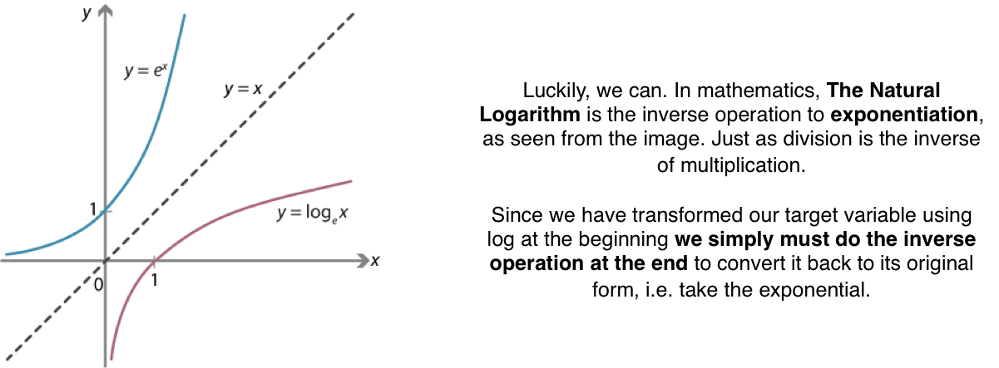

In [11]:
Image(filename='Images/loge.png')

***

### 3.3 - Treat missing values

***Missing values are the Data Scientists other nightmare.***

A missing value is an entry in a column that has no assigned value. This can mean multiple things:
- A missing value may be the **result of an error during the production of the dataset**. This could be a human error, or machinery error depending on where the data comes from. 
- A missing value in some cases, may just mean a that a **'zero'** should be present. In which case, it can be replaced by a 0. The data description provided helps to address situations like these.
- However, missing values represent no information. Therefore, **does the fact that you don't know what value to assign an entry, mean that filling it with a 'zero' is always a good fit?** 

Some algorithms do not like missing values. Some are capable of handling them, but others are not. Therefore since we are using a variety of algorithms, it's best to treat them in an appropriate way.

**If you have missing values, you have two options**:
- Delete the entire row
- Fill the missing entry with an imputed value

In order to treat this dataset, first of all I will create a dataset of the training and test data in order to make changes consistent across both. Then, I will cycle through each feature with missing values and treat them individually based on the data description, or my judgement.

In [12]:
# First of all, save the length of the training and test data for use later
ntrain = train.shape[0]
ntest = test.shape[0]

# Also save the target value, as we will remove this
y_train = train.SalePrice.values

# concatenate training and test data into all_data
all_data = pd.concat((train, test)).reset_index(drop=True)
all_data.drop(['SalePrice'], axis=1, inplace=True)

print("all_data shape: {}".format(all_data.shape))

all_data shape: (2917, 79)


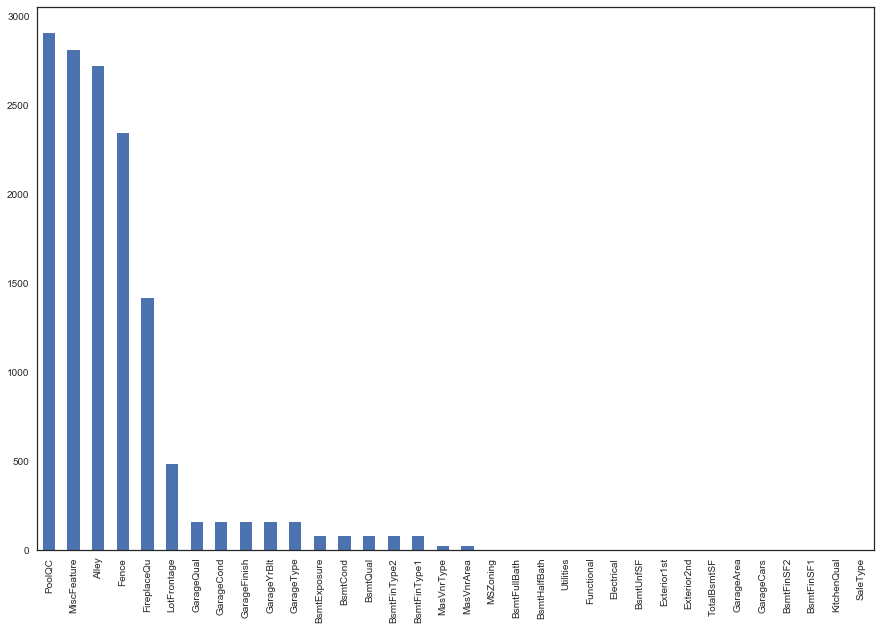

In [13]:
# aggregate all null values 
all_data_na = all_data.isnull().sum()

# get rid of all the values with 0 missing values
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)
plt.subplots(figsize =(15, 10))
all_data_na.plot(kind='bar');

Above you can see where the missing values sit. **Note** it may look like some of the features have 0 missing values, but actually they have 1 by closer inspection.

- Through reference of the data description, this gives guidance on how to treat missing values for some columns. For ones where guidance isn't provided, I have used intuition which I will explain. Below, you will see how I treated each feature.

In [14]:
# Using data description, fill these missing values with "None"
for col in ("PoolQC", "MiscFeature", "Alley", "Fence", "FireplaceQu",
           "GarageType", "GarageFinish", "GarageQual", "GarageCond",
           "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1",
            "BsmtFinType2", "MSSubClass", "MasVnrType"):
    all_data[col] = all_data[col].fillna("None")
print("'None' - treated...")

# The area of the lot out front is likely to be similar to the houses in the local neighbourhood
# Therefore, let's use the median value of the houses in the neighbourhood to fill this feature
all_data["LotFrontage"] = all_data.groupby("Neighborhood")["LotFrontage"].transform(
    lambda x: x.fillna(x.median()))
print("'LotFrontage' - treated...")

# Using data description, fill these missing values with 0 
for col in ("GarageYrBlt", "GarageArea", "GarageCars", "BsmtFinSF1", 
           "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "MasVnrArea",
           "BsmtFullBath", "BsmtHalfBath"):
    all_data[col] = all_data[col].fillna(0)
print("'0' - treated...")


# Fill these features with their mode, the most commonly occuring value. This is okay since there are a low number of missing values for these features
all_data['MSZoning'] = all_data['MSZoning'].fillna(all_data['MSZoning'].mode()[0])
all_data['Electrical'] = all_data['Electrical'].fillna(all_data['Electrical'].mode()[0])
all_data['KitchenQual'] = all_data['KitchenQual'].fillna(all_data['KitchenQual'].mode()[0])
all_data['Exterior1st'] = all_data['Exterior1st'].fillna(all_data['Exterior1st'].mode()[0])
all_data['Exterior2nd'] = all_data['Exterior2nd'].fillna(all_data['Exterior2nd'].mode()[0])
all_data['SaleType'] = all_data['SaleType'].fillna(all_data['SaleType'].mode()[0])
all_data["Functional"] = all_data["Functional"].fillna(all_data['Functional'].mode()[0])
print("'mode' - treated...")

all_data_na = all_data.isnull().sum()
print("Features with missing values: ", all_data_na.drop(all_data_na[all_data_na == 0].index))

'None' - treated...
'LotFrontage' - treated...
'0' - treated...
'mode' - treated...
Features with missing values:  Utilities    2
dtype: int64


Here we see that we have 1 remaining feature with missing values, Utilities.

- Let's inspect this closer to see how to treat it.

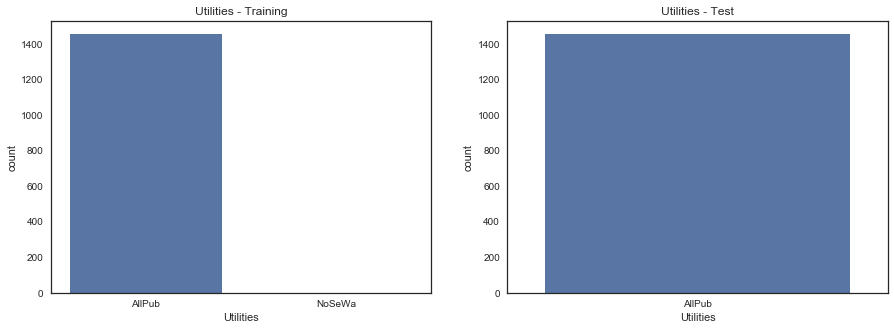

In [15]:
plt.subplots(figsize =(15, 5))

plt.subplot(1, 2, 1)
g = sns.countplot(x = "Utilities", data = train).set_title("Utilities - Training")

plt.subplot(1, 2, 2)
g = sns.countplot(x = "Utilities", data = test).set_title("Utilities - Test")

This tell us that within the training dataset, Utilities has two unique values: "AllPub" and "NoSeWa". With "AllPub" being by far the most common.
- However, the test dataset has only 1 value for this column, which means that it holds no predictive power because it is a constant for all test observations.

Therefore, we can drop this column

In [16]:
# From inspection, we can remove Utilities
all_data = all_data.drop(['Utilities'], axis=1)

all_data_na = all_data.isnull().sum()
print("Features with missing values: ", len(all_data_na.drop(all_data_na[all_data_na == 0].index)))

Features with missing values:  0


***

### 3.4 - Transform numeric features into categorical features

Some numeric columns are better off as categorical features. This may be because they represent a finite selection of numbers, which don't accurately represent a continuous number. Therefore, they are better of being represented as classes of a feature.

- Continuous numbers can be encoded using binnings. These binnings have to be decided by the individual.
- However, categorical features can be used to create dummy variables. With a finite number of possibilities, each value can be used to create its own variable. This is handy technique to know when feature engineering.

Below are the features in the dataset that are better off as categorical variables.

In [17]:
# MSSubClass = The building class
all_data['MSSubClass'] = all_data['MSSubClass'].apply(str)

# Overall condition
all_data['OverallCond'] = all_data['OverallCond'].astype(str)

# Year and month sold
all_data['YrSold'] = all_data['YrSold'].astype(str)
all_data['MoSold'] = all_data['MoSold'].astype(str)

# Garage built year - I would like to hand craft categoricl binnings. Therefore I will convert to an integer, replace the values with a category and then convert this to a more meaningful class 
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].apply(int)

# Locate and replace values
all_data.loc[all_data['GarageYrBlt'] == 0, 'GarageYrBlt'] = 0
all_data.loc[(all_data['GarageYrBlt'] >= 1) & (all_data['GarageYrBlt'] < 1900), 'GarageYrBlt'] = 1
all_data.loc[(all_data['GarageYrBlt'] >= 1900) & (all_data['GarageYrBlt'] <= 1910), 'GarageYrBlt'] = 2
all_data.loc[(all_data['GarageYrBlt'] >= 1911) & (all_data['GarageYrBlt'] <= 1920), 'GarageYrBlt'] = 3
all_data.loc[(all_data['GarageYrBlt'] >= 1921) & (all_data['GarageYrBlt'] <= 1930), 'GarageYrBlt'] = 4
all_data.loc[(all_data['GarageYrBlt'] >= 1931) & (all_data['GarageYrBlt'] <= 1940), 'GarageYrBlt'] = 5
all_data.loc[(all_data['GarageYrBlt'] >= 1941) & (all_data['GarageYrBlt'] <= 1950), 'GarageYrBlt'] = 6
all_data.loc[(all_data['GarageYrBlt'] >= 1951) & (all_data['GarageYrBlt'] <= 1960), 'GarageYrBlt'] = 7
all_data.loc[(all_data['GarageYrBlt'] >= 1961) & (all_data['GarageYrBlt'] <= 1970), 'GarageYrBlt'] = 8
all_data.loc[(all_data['GarageYrBlt'] >= 1971) & (all_data['GarageYrBlt'] <= 1980), 'GarageYrBlt'] = 9
all_data.loc[(all_data['GarageYrBlt'] >= 1981) & (all_data['GarageYrBlt'] <= 1990), 'GarageYrBlt'] = 10
all_data.loc[(all_data['GarageYrBlt'] >= 1991) & (all_data['GarageYrBlt'] <= 2000), 'GarageYrBlt'] = 11
all_data.loc[(all_data['GarageYrBlt'] >= 2001) & (all_data['GarageYrBlt'] <= 2010), 'GarageYrBlt'] = 12
all_data.loc[(all_data['GarageYrBlt'] >= 2011), 'GarageYrBlt'] = 13

# Replace with categorical values
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(0, 'NoGarage')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(1, 'less_1900')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(2, '1900_1910')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(3, '1911_1920')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(4, '1921_1930')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(5, '1931_1940')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(6, '1941_1950')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(7, '1951_1960')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(8, '1961_1970')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(9, '1971_1980')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(10, '1981_1990')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(11, '1991_2000')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(12, '2001_2010')
all_data['GarageYrBlt'] = all_data['GarageYrBlt'].replace(13, '2010+')

print("Transformations of numerical to categorical features = complete...")

Transformations of numerical to categorical features = complete...


***

### 3.5 - Label encoding

Algorithms work best with numerical values. Therefore, **what can we do with features that include strings as their values?**

- Well for each unique string contained in a feature, we can replace them with a unique numerical value.
- We can do this, using the **Label Encoder**, that does this automatically for us.

In [18]:
columns = ('FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 
        'ExterQual', 'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 
        'BsmtFinType2', 'Functional', 'Fence', 'BsmtExposure', 'GarageFinish', 'LandSlope',
        'LotShape', 'PavedDrive', 'Street', 'Alley', 'CentralAir', 'MSSubClass', 'OverallCond', 
        'YrSold', 'MoSold')
# process columns, apply LabelEncoder to categorical features
for c in columns:
    lbl = LabelEncoder() 
    lbl.fit(list(all_data[c].values)) 
    all_data[c] = lbl.transform(list(all_data[c].values))
        
print('Shape all_data: ', all_data.shape)

Shape all_data:  (2917, 78)


***

## 4. Feature engineering
### 4.1 - Combinations

Using the 79 descriptive variables that we have in the dataset, we can combine some of them together to create new variables.

In [19]:
# Overall quality of the house
all_data["OverallGrade"] = all_data["OverallQual"] * all_data["OverallCond"]
# Overall quality of the garage
all_data["GarageGrade"] = all_data["GarageQual"] * all_data["GarageCond"]
# Overall quality of the exterior
all_data["ExterGrade"] = all_data["ExterQual"] * all_data["ExterCond"]
# Overall kitchen score
all_data["KitchenScore"] = all_data["KitchenAbvGr"] * all_data["KitchenQual"]
# Overall fireplace score
all_data["FireplaceScore"] = all_data["Fireplaces"] * all_data["FireplaceQu"]
# Overall garage score
all_data["GarageScore"] = all_data["GarageArea"] * all_data["GarageQual"]
# Overall pool score
all_data["PoolScore"] = all_data["PoolArea"] * all_data["PoolQC"]
# Overall quality of the house
all_data["OverallGrade"] = all_data["OverallQual"] * all_data["OverallCond"]
# Overall quality of the exterior
all_data["OverallExterGrade"] = all_data["ExterQual"] * all_data["ExterCond"]
# Overall pool score
all_data["OverallPoolScore"] = all_data["PoolArea"] * all_data["PoolQC"]
# Overall garage score
all_data["OverallGarageScore"] = all_data["GarageArea"] * all_data["GarageQual"]
# Overall fireplace score
all_data["OverallFireplaceScore"] = all_data["Fireplaces"] * all_data["FireplaceQu"]
# Total number of bathrooms
all_data["TotalBath"] = all_data["BsmtFullBath"] + (0.5 * all_data["BsmtHalfBath"]) + all_data["FullBath"] + (0.5 * all_data["HalfBath"])
# Total SF for house
all_data["TotalSF"] = all_data["GrLivArea"] + all_data["TotalBsmtSF"]
# Total SF for 1st + 2nd floors
all_data["FloorsSF"] = all_data["1stFlrSF"] + all_data["2ndFlrSF"]
# Total SF for porch
all_data["PorchSF"] = all_data["OpenPorchSF"] + all_data["EnclosedPorch"] + all_data["3SsnPorch"] + all_data["ScreenPorch"]
# Has masonry veneer or not
all_data["HasMasVnr"] = all_data.MasVnrType.replace({"BrkCmn" : 1, "BrkFace" : 1, "CBlock" : 1, "Stone" : 1, "None" : 0})
# House completed before sale or not
all_data["CompletedBFSale"] = all_data.SaleCondition.replace({"Abnorml" : 0, "Alloca" : 0, "AdjLand" : 0, "Family" : 0, "Normal" : 0, "Partial" : 1})
print("Combinations completed...")

Combinations completed...


***

### 4.2 - Polynomials

The most common relationship we may think of between two variables, would be a straight line or a linear relationship. What this means is that if we increase the predictor by 1 unit, the response always increases by X units. However, not all data has a linear relationship and therefore it may be necessary for your model to fit the more complex relationships in the data. 

But how do you fit a model to data with complex relationships, unexplainable by a linear function? There are a variety of curve-fitting methods you can choose from to help you with this.

- The most common way to fit curves to the data is to include polynomial terms, such as squared or cubed predictors.
- Typically, you choose the model order by the number of bends you need in your line. Each increase in the exponent produces one more bend in the curved fitted line. It’s very rare to use more than a cubic term.

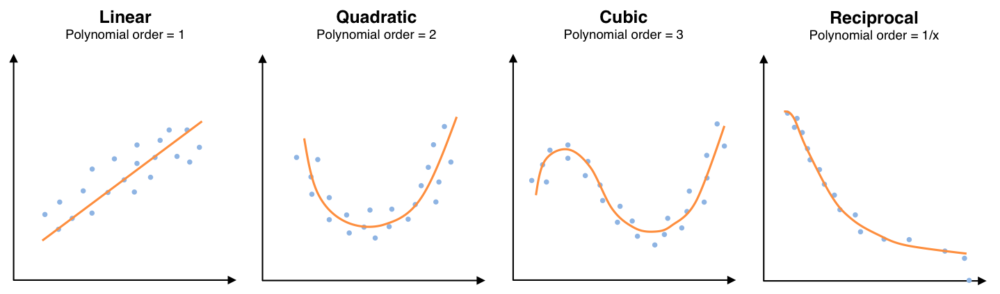

In [20]:
Image(filename='Images/combinations.png')

- If your response data follows a pattern that descends down to a lower bound, or ascends up to an upper bound, you can fit this type of relationship by including the reciprocal (1/x) of one or more predictor variables in the model.
    - Generally, you want to use this form when the size of effect for a predictor variable decreases as its value increases. 
- Because the gradient is a function of 1/x, the gradient gets flatter as x increases. For this type of model, x can never equal 0 because you can’t divide by zero.

*So... now that you're armed with this information, what's important to know is that in order to model non-linear, complex relationships between response and predictor variables, we can create combinations of these variables with increasing order, or reciprocal orders.*

- Since we have such a high number of variables in the dataset, it's overkill to create polynomials of each feature. Therefore, I will look at the top 10 correlating features with the target variable from the training dataset and create polynomials of these features, or equivalently the new combinations I have created from them.

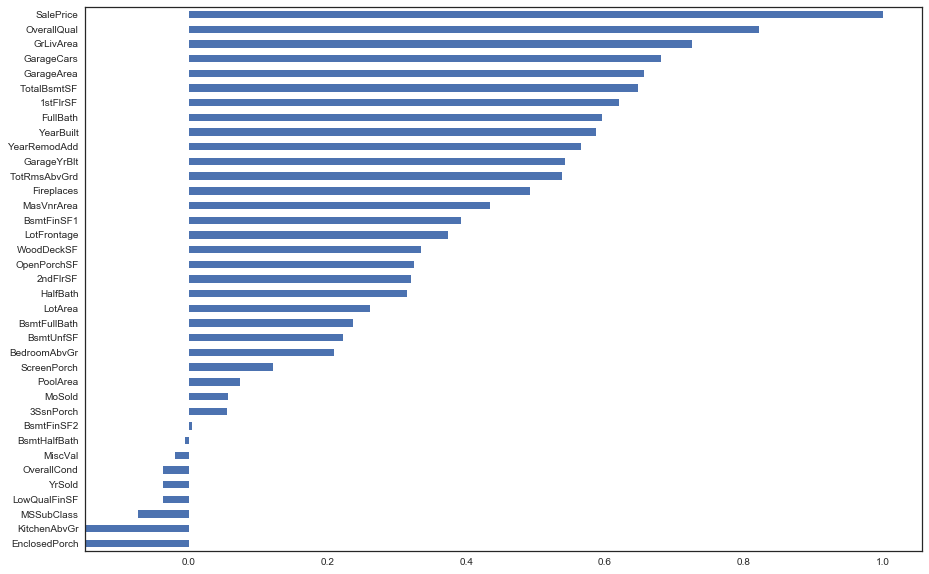

In [21]:
# correlations with the target
corr = train.corr()
corr.sort_values(["SalePrice"], ascending = True, inplace = True)
corr = corr.SalePrice
plt.subplots(figsize =(15, 10))
corr.plot(kind='barh');

In [22]:
# Top 10 features polynomials

# Quadratic
all_data["OverallQual-2"] = all_data["OverallQual"] ** 2
all_data["TotalSF-2"] = all_data["TotalSF"] ** 2
all_data["FloorsSF-2"] = all_data["FloorsSF"] ** 2
all_data["GrLivArea-2"] = all_data["GrLivArea"] ** 2
all_data["ExterQual-2"] = all_data["ExterQual"] ** 2
all_data["GarageCars-2"] = all_data["GarageCars"] ** 2
all_data["TotalBath-2"] = all_data["TotalBath"] ** 2
all_data["KitchenQual-2"] = all_data["KitchenQual"] ** 2
all_data["GarageScore-2"] = all_data["GarageScore"] ** 2
print("Quadratics done...")

# Cubic
all_data["OverallQual-3"] = all_data["OverallQual"] ** 3
all_data["TotalSF-3"] = all_data["TotalSF"] ** 3
all_data["FloorsSF-3"] = all_data["FloorsSF"] ** 3
all_data["GrLivArea-3"] = all_data["GrLivArea"] ** 3
all_data["ExterQual-3"] = all_data["ExterQual"] ** 3
all_data["GarageCars-3"] = all_data["GarageCars"] ** 3
all_data["TotalBath-3"] = all_data["TotalBath"] ** 3
all_data["KitchenQual-3"] = all_data["KitchenQual"] ** 3
all_data["GarageScore-3"] = all_data["GarageScore"] ** 3
print("Cubics done...")

# Square Root
all_data["OverallQual-Sq"] = np.sqrt(all_data["OverallQual"])
all_data["TotalSF-Sq"] = np.sqrt(all_data["TotalSF"])
all_data["FloorsSF-Sq"] = np.sqrt(all_data["FloorsSF"])
all_data["GrLivArea-Sq"] = np.sqrt(all_data["GrLivArea"])
all_data["ExterQual-Sq"] = np.sqrt(all_data["ExterQual"])
all_data["GarageCars-Sq"] = np.sqrt(all_data["GarageCars"])
all_data["TotalBath-Sq"] = np.sqrt(all_data["TotalBath"])
all_data["KitchenQual-Sq"] = np.sqrt(all_data["KitchenQual"])
all_data["GarageScore-Sq"] = np.sqrt(all_data["GarageScore"])
print("Square Roots done...")

Quadratics done...
Cubics done...
Square Roots done...


***

### 4.3 - Treating skewed features

As touched on earlier, skewed numeric variables are not desirable when using Machine Learning algorithms. The reason why we want to do this is move the models focus away from any extreme values, to create a generalised solution. We can tame these extreme values by transforming skewed features.

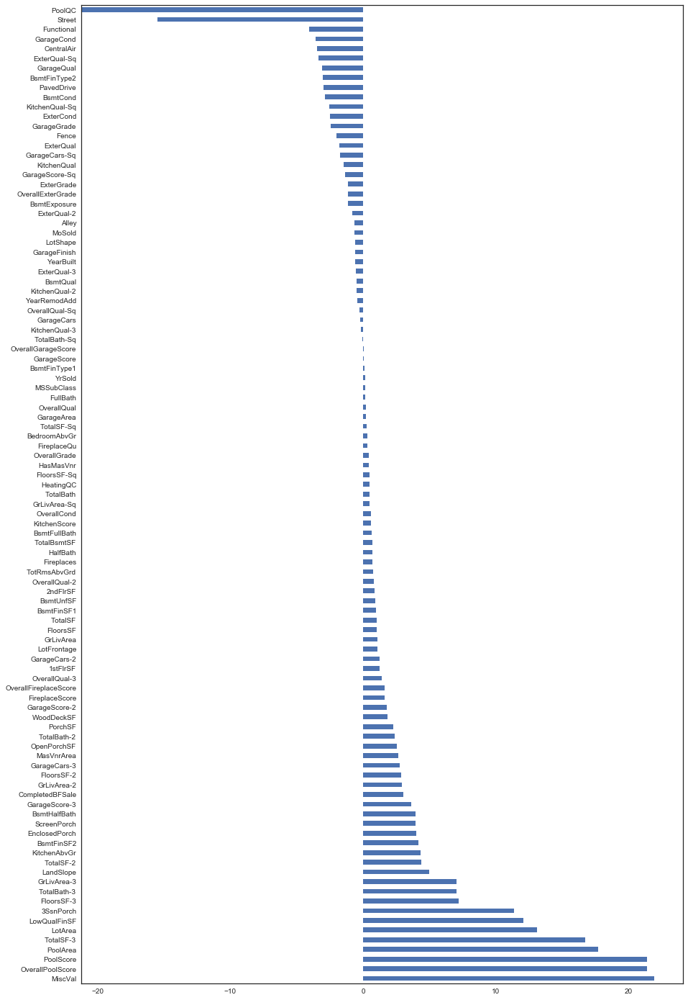

In [23]:
# First lets single out the numeric features
numeric_feats = all_data.dtypes[all_data.dtypes != "object"].index

# Check how skewed they are
skewed_feats = all_data[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)

plt.subplots(figsize =(15, 25))
skewed_feats.plot(kind='barh');

Clearly, we have a variety of positive and negative skewing features. Now I will transform the features with skew > 0.5 to follow more closely the normal distribution.

- **Note**: I am using the Box-Cox transformation to transform non-normal variables into a normal shape. Normality is an important assumption for many statistical techniques; if your data isn't normal, applying a Box-Cox means that you are able to run a broader number of tests.

In [24]:
skewness = skewed_feats[abs(skewed_feats) > 0.5]
print("There are ", skewness.shape[0],  "skewed numerical features to Box-Cox transform")

skewed_features = skewness.index
lam = 0.15
for feat in skewed_features:
    all_data[feat] = boxcox1p(all_data[feat], lam)

There are  77 skewed numerical features to Box-Cox transform


- Our data is almost ready for modeling. The last thing we must do is engineer dummy variables from all of the categorical features we have in our dataset.

In [25]:
# Create final dummies
all_data = pd.get_dummies(all_data)
print(all_data.shape)

(2917, 276)


***

# 5. 
## Modeling
### 5.1 - Preparation of data

- Now that our dataset is ready for modeling, we must prepare it from training, testing and prediction.

In [26]:
# First, re-create the training and test datasets
train = all_data[:ntrain]
test = all_data[ntrain:]

print(train.shape)
print(test.shape)

(1458, 276)
(1459, 276)


In [27]:
# Next we want to sample our training data to test for performance of robustness ans accuracy, before applying to the test data
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(train, y_train, test_size=0.3, random_state=42)

# X_train = predictor features for estimation dataset
# X_test = predictor variables for validation dataset
# Y_train = target variable for the estimation dataset
# Y_test = target variable for the estimation dataset

print('X_train: ', X_train.shape, '\nX_test: ', X_test.shape, '\nY_train: ', Y_train.shape, '\nY_test: ', Y_test.shape)

X_train:  (1020, 276) 
X_test:  (438, 276) 
Y_train:  (1020,) 
Y_test:  (438,)


***

### 5.2 - Training

We are finally ready to train our models. For this analysis I am using 8 different algorithms:
- **Kernel Ridge Regression**
- **Elastic Net**
- **Lasso**
- **Gradient Boosting**
- **Bayesian Ridge**
- **Lasso Lars IC**
- **Random Forest Regressor**
- **XGBoost**

The method of measuring accuracy was chosen to be **Root Mean Squared Error**, as described within the competition.

In [28]:
#Machine Learning Algorithm (MLA) Selection and Initialization
models = [KernelRidge(), ElasticNet(), Lasso(), GradientBoostingRegressor(), BayesianRidge(), LassoLarsIC(), RandomForestRegressor(), xgb.XGBRegressor()]

# First I will use ShuffleSplit as a way of randomising the cross validation samples.
shuff = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

#create table to compare MLA metrics
columns = ['Name', 'Parameters', 'Train Accuracy Mean', 'Test Accuracy']
before_model_compare = pd.DataFrame(columns = columns)

#index through models and save performance to table
row_index = 0
for alg in models:

    #set name and parameters
    model_name = alg.__class__.__name__
    before_model_compare.loc[row_index, 'Name'] = model_name
    before_model_compare.loc[row_index, 'Parameters'] = str(alg.get_params())
    
    alg.fit(X_train, Y_train)
    
    #score model with cross validation: http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html#sklearn.model_selection.cross_validate
    training_results = np.sqrt((-cross_val_score(alg, X_train, Y_train, cv = shuff, scoring= 'neg_mean_squared_error')).mean())
    test_results = np.sqrt(((Y_test-alg.predict(X_test))**2).mean())
    
    before_model_compare.loc[row_index, 'Train Accuracy Mean'] = (training_results)*100
    before_model_compare.loc[row_index, 'Test Accuracy'] = (test_results)*100
    
    row_index+=1
    print(row_index, alg.__class__.__name__, 'trained...')

decimals = 3
before_model_compare['Train Accuracy Mean'] = before_model_compare['Train Accuracy Mean'].apply(lambda x: round(x, decimals))
before_model_compare['Test Accuracy'] = before_model_compare['Test Accuracy'].apply(lambda x: round(x, decimals))
before_model_compare

1 KernelRidge trained...
2 ElasticNet trained...
3 Lasso trained...
4 GradientBoostingRegressor trained...
5 BayesianRidge trained...
6 LassoLarsIC trained...
7 RandomForestRegressor trained...
8 XGBRegressor trained...


,Name,Parameters,Train Accuracy Mean,Test Accuracy
0,KernelRidge,"{'alpha': 1, 'coef0': 1, 'degree': 3, 'gamma':...",12.090,11.587
1,ElasticNet,"{'alpha': 1.0, 'copy_X': True, 'fit_intercept'...",18.104,17.876
2,Lasso,"{'alpha': 1.0, 'copy_X': True, 'fit_intercept'...",19.309,18.928
3,GradientBoostingRegressor,"{'alpha': 0.9, 'criterion': 'friedman_mse', 'i...",12.267,11.714
4,BayesianRidge,"{'alpha_1': 1e-06, 'alpha_2': 1e-06, 'compute_...",11.422,11.461
5,LassoLarsIC,"{'copy_X': True, 'criterion': 'aic', 'eps': 2....",12.238,12.643
6,RandomForestRegressor,"{'bootstrap': True, 'criterion': 'mse', 'max_d...",15.086,14.639
7,XGBRegressor,"{'base_score': 0.5, 'booster': 'gbtree', 'cols...",12.223,12.062


- We can see that each of the models performs with varying ability, with **Bayesian Ridge** having the best accuracy score on the training dataset and accuracy on the validation dataset.

***

### 5.3 - Optimisation

- As you can see from the above table, the accuracy for these models is not quite as good as it could be.
- This is because we use the default configuration of parameters for each of the algorithms.

So now, we will use **GridSearchCV** to find the best combinations of parameters to produce the highest scoring models.

**Note**: GridSearchCV uses a grid of parameters to optimise the algorithms. This grid can get extremely large, and therefore requires a lot of computation power to complete. I have included a set of answers in the grids to cut down computation time, but these were not my final ones. I'll leave this up to you to find the best values. But in reality, you will have to fill these grids with appropriate values with the goal of trying to find the best combination.

In [29]:
models = [KernelRidge(), ElasticNet(), Lasso(), GradientBoostingRegressor(), BayesianRidge(), LassoLarsIC(), RandomForestRegressor(), xgb.XGBRegressor()]

KR_param_grid = {'alpha': [0.1], 'coef0': [100], 'degree': [1], 'gamma': [None], 'kernel': ['polynomial']}
EN_param_grid = {'alpha': [0.001], 'copy_X': [True], 'l1_ratio': [0.6], 'fit_intercept': [True], 'normalize': [False], 
                         'precompute': [False], 'max_iter': [300], 'tol': [0.001], 'selection': ['random'], 'random_state': [None]}
LASS_param_grid = {'alpha': [0.0005], 'copy_X': [True], 'fit_intercept': [True], 'normalize': [False], 'precompute': [False], 
                    'max_iter': [300], 'tol': [0.01], 'selection': ['random'], 'random_state': [None]}
GB_param_grid = {'loss': ['huber'], 'learning_rate': [0.1], 'n_estimators': [300], 'max_depth': [3], 
                                        'min_samples_split': [0.0025], 'min_samples_leaf': [5]}
BR_param_grid = {'n_iter': [200], 'tol': [0.00001], 'alpha_1': [0.00000001], 'alpha_2': [0.000005], 'lambda_1': [0.000005], 
                 'lambda_2': [0.00000001], 'copy_X': [True]}
LL_param_grid = {'criterion': ['aic'], 'normalize': [True], 'max_iter': [100], 'copy_X': [True], 'precompute': ['auto'], 'eps': [0.000001]}
RFR_param_grid = {'n_estimators': [50], 'max_features': ['auto'], 'max_depth': [None], 'min_samples_split': [5], 'min_samples_leaf': [2]}
XGB_param_grid = {'max_depth': [3], 'learning_rate': [0.1], 'n_estimators': [300], 'booster': ['gbtree'], 'gamma': [0], 'reg_alpha': [0.1],
                  'reg_lambda': [0.7], 'max_delta_step': [0], 'min_child_weight': [1], 'colsample_bytree': [0.5], 'colsample_bylevel': [0.2],
                  'scale_pos_weight': [1]}
params_grid = [KR_param_grid, EN_param_grid, LASS_param_grid, GB_param_grid, BR_param_grid, LL_param_grid, RFR_param_grid, XGB_param_grid]

after_model_compare = pd.DataFrame(columns = columns)

row_index = 0
for alg in models:
    
    gs_alg = GridSearchCV(alg, param_grid = params_grid[0], cv = shuff, scoring = 'neg_mean_squared_error', n_jobs=-1)
    params_grid.pop(0)

    #set name and parameters
    model_name = alg.__class__.__name__
    after_model_compare.loc[row_index, 'Name'] = model_name
    
    gs_alg.fit(X_train, Y_train)
    gs_best = gs_alg.best_estimator_
    after_model_compare.loc[row_index, 'Parameters'] = str(gs_alg.best_params_)
    
    #score model with cross validation: http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html#sklearn.model_selection.cross_validate
    after_training_results = np.sqrt(-gs_alg.best_score_)
    after_test_results = np.sqrt(((Y_test-gs_alg.predict(X_test))**2).mean())
    
    after_model_compare.loc[row_index, 'Train Accuracy Mean'] = (after_training_results)*100
    after_model_compare.loc[row_index, 'Test Accuracy'] = (after_test_results)*100
    
    row_index+=1
    print(row_index, alg.__class__.__name__, 'trained...')

decimals = 3
after_model_compare['Train Accuracy Mean'] = after_model_compare['Train Accuracy Mean'].apply(lambda x: round(x, decimals))
after_model_compare['Test Accuracy'] = after_model_compare['Test Accuracy'].apply(lambda x: round(x, decimals))
after_model_compare

1 KernelRidge trained...
2 ElasticNet trained...
3 Lasso trained...
4 GradientBoostingRegressor trained...
5 BayesianRidge trained...
6 LassoLarsIC trained...
7 RandomForestRegressor trained...
8 XGBRegressor trained...


,Name,Parameters,Train Accuracy Mean,Test Accuracy
0,KernelRidge,"{'alpha': 0.1, 'coef0': 100, 'degree': 1, 'gam...",11.409,11.483
1,ElasticNet,"{'alpha': 0.001, 'copy_X': True, 'fit_intercep...",11.216,11.082
2,Lasso,"{'alpha': 0.0005, 'copy_X': True, 'fit_interce...",11.250,11.044
3,GradientBoostingRegressor,"{'learning_rate': 0.1, 'loss': 'huber', 'max_d...",11.922,12.050
4,BayesianRidge,"{'alpha_1': 1e-08, 'alpha_2': 5e-06, 'copy_X':...",11.422,11.461
5,LassoLarsIC,"{'copy_X': True, 'criterion': 'aic', 'eps': 1e...",11.035,11.154
6,RandomForestRegressor,"{'max_depth': None, 'max_features': 'auto', 'm...",13.970,13.446
7,XGBRegressor,"{'booster': 'gbtree', 'colsample_bylevel': 0.2...",11.930,11.349


Overall we can see that the training and test scores for each of the models have decreased, which is what we want.
- Now we have a set of highly tuned algorithms to use for **Stacking**.

***

### 5.4 - Stacking

Now that we have a set of highly tuned algorithms, a rather famous and successful technique to further improve the accuracy of these models, is to use **Stacking**. Let me explain what this means.

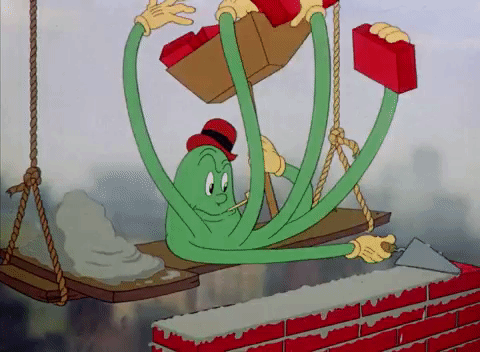

In [30]:
Image(filename='Images/stacking.gif.png', width = 800)

If you hadn't figured it out already, our brick-laying friend enticed us in earlier on in order to explain **stacking**.

Brick-laying is an art form. Where I live in London today, remain buildings that have stood for hundreds and even thousands of years. Without having a skilled brick-layer or to stack them properly, nobody would ever want to visit or live in this city., This animation shows the art of stacking bricks on top of one another to form something much greater, a wall, a house or even a building. **This is exactly what we are going to do by stacking several algorithms together, to form a much stronger one.**  

The steps for this technique are shown below:
1. **Create a set of algorithms ready for stacking** - We've done this...
2. **Split the original training data into a training and validation sample** - We've done this too...
3. **Train the algorithms on the training sample** - Also done this...
4. **For each algorithm, apply the trained models to the validation dataset and create a set of predictions**, 1 column for each model, as a new table. Call this the *new training dataset*.
5. **Also apply the trained algorithm to the test dataset and create a final set of predictions**, 1 column for each model, as a new table. Call this *new test dataset*.
6. **For the new training dataset, we have labeled outputs, in the form of Y_test**. Now we must train another model on these two feature sets: *new training dataset* and Y_test.
7. **Use this newly trained model to predict values** for *new test dataset*.

Now I understand that this sounds very confusing, and probably doesn't make much sense. Let me explain this further with some visualisations.

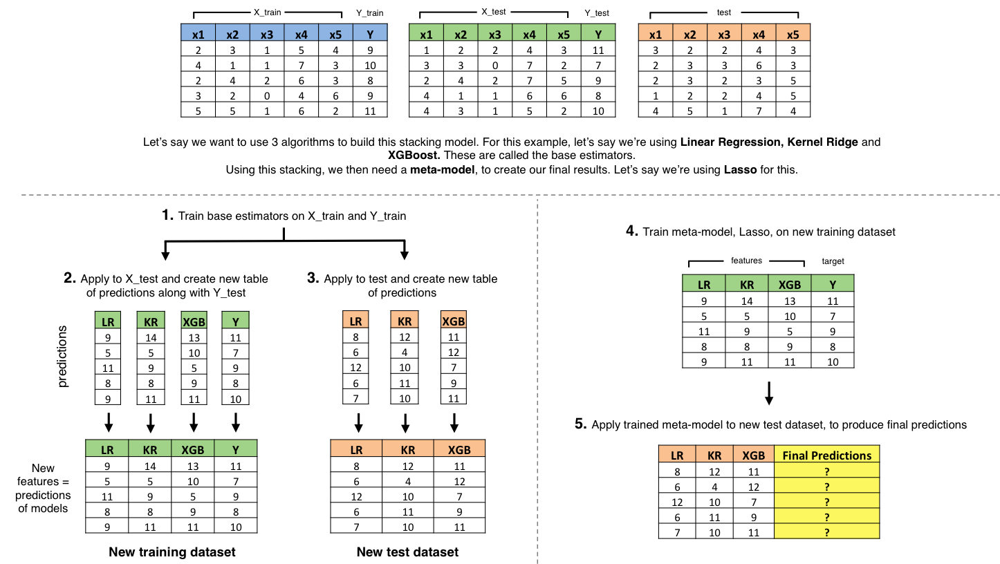

In [31]:
Image(filename='Images/stackingexp.png')

- Before I start with the stacking, I need to decide which algorithms to use as my base estimators, and which to use as the meta-model.

- Since **Lasso** performed the best after optimisation, I chose this to be the **meta-model**. All other models will be used as base estimators.

- So now, I will cycle through each optimised estimator, train them on the training dataset, apply to them the validation and test datasets, then finally outputting the predictions for validation and test into two new datasets: **stacked_validation_train** and **stacked_test_train**.

In [32]:
models = [KernelRidge(), ElasticNet(), Lasso(), GradientBoostingRegressor(), BayesianRidge(), LassoLarsIC(), RandomForestRegressor(), xgb.XGBRegressor()]
names = ['KernelRidge', 'ElasticNet', 'Lasso', 'Gradient Boosting', 'Bayesian Ridge', 'Lasso Lars IC', 'Random Forest', 'XGBoost']
params_grid = [KR_param_grid, EN_param_grid, LASS_param_grid, GB_param_grid, BR_param_grid, LL_param_grid, RFR_param_grid, XGB_param_grid]
stacked_validation_train = pd.DataFrame()
stacked_test_train = pd.DataFrame()

row_index=0

for alg in models:
    
    gs_alg = GridSearchCV(alg, param_grid = params_grid[0], cv = shuff, scoring = 'neg_mean_squared_error', n_jobs=-1)
    params_grid.pop(0)
    
    gs_alg.fit(X_train, Y_train)
    gs_best = gs_alg.best_estimator_
    stacked_validation_train.insert(loc = row_index, column = names[0], value = gs_best.predict(X_test))
    print(row_index+1, alg.__class__.__name__, 'predictions added to stacking validation dataset...')
    
    stacked_test_train.insert(loc = row_index, column = names[0], value = gs_best.predict(test))
    print(row_index+1, alg.__class__.__name__, 'predictions added to stacking test dataset...')
    print("-"*50)
    names.pop(0)
    
    row_index+=1
    
print('Done')

1 KernelRidge predictions added to stacking validation dataset...
1 KernelRidge predictions added to stacking test dataset...
--------------------------------------------------
2 ElasticNet predictions added to stacking validation dataset...
2 ElasticNet predictions added to stacking test dataset...
--------------------------------------------------
3 Lasso predictions added to stacking validation dataset...
3 Lasso predictions added to stacking test dataset...
--------------------------------------------------
4 GradientBoostingRegressor predictions added to stacking validation dataset...
4 GradientBoostingRegressor predictions added to stacking test dataset...
--------------------------------------------------
5 BayesianRidge predictions added to stacking validation dataset...
5 BayesianRidge predictions added to stacking test dataset...
--------------------------------------------------
6 LassoLarsIC predictions added to stacking validation dataset...
6 LassoLarsIC predictions added

- Let's take a quick look at what these new datasets look like:

In [33]:
stacked_validation_train.head()

,KernelRidge,ElasticNet,Lasso,Gradient Boosting,Bayesian Ridge,Lasso Lars IC,Random Forest,XGBoost
0,12.345002,12.342513,12.339605,12.291042,12.346440,12.352238,12.252978,12.270009
1,11.506633,11.485974,11.492334,11.497841,11.508389,11.525210,11.473802,11.512831
2,11.542059,11.542992,11.543078,11.650120,11.543551,11.563328,11.700033,11.634089
3,11.981817,11.976914,11.974871,11.979318,11.985406,11.989015,11.948086,11.954720
4,12.685371,12.669215,12.659620,12.643696,12.682953,12.630939,12.608065,12.710805


- The new training dataset is 438 rows of predictions from the 8 algorithms we decided to use.

In [34]:
stacked_test_train.head()

,KernelRidge,ElasticNet,Lasso,Gradient Boosting,Bayesian Ridge,Lasso Lars IC,Random Forest,XGBoost
0,11.635777,11.645403,11.653393,11.714598,11.637118,11.696693,11.708674,11.697837
1,11.873586,11.897072,11.893617,12.001663,11.874227,11.952496,12.015312,11.987579
2,12.132385,12.143373,12.143115,12.167828,12.131780,12.136548,12.076755,12.152667
3,12.146017,12.156459,12.154553,12.132832,12.145158,12.175647,12.111213,12.147079
4,12.165083,12.185471,12.189212,12.139887,12.168321,12.205163,12.193252,12.098074


- The new test dataset is 1459 rows of predictions from the 8 algorithms we decided to use.
- I will use these two datasets to train and produce predictions for the meta-model, Lasso.

In [35]:
# First drop the Lasso results from the table, as we will be using Lasso as the meta-model
drop = ['Lasso']
stacked_validation_train.drop(drop, axis=1, inplace=True)
stacked_test_train.drop(drop, axis=1, inplace=True)

# Now fit the meta model and generate predictions
meta_model = make_pipeline(RobustScaler(), Lasso(alpha=0.00001, copy_X = True, fit_intercept = True,
                                              normalize = False, precompute = False, max_iter = 10000,
                                              tol = 0.0001, selection = 'random', random_state = None))
meta_model.fit(stacked_validation_train, Y_test)

meta_model_pred = np.expm1(meta_model.predict(stacked_test_train))
print("Meta-model trained and applied!...")

Meta-model trained and applied!...


***

### 5.5 - Ensemble

- However, another famous and successful technique for Machine Learning are **Ensemble methods**.
    - These are effective when using many different models of varying degrees of accuracy. 
    - They work on the idea that many weak learners, can produce a strong learner.
- Therefore, using the meta-model that I will create, I will also combine this with the results of the individual optimised models to create an ensemble.
- In order to create this ensemble, I must collect the final predictions of each of the optimised models. I will do this now.

In [36]:
models = [KernelRidge(), ElasticNet(), Lasso(), GradientBoostingRegressor(), BayesianRidge(), LassoLarsIC(), RandomForestRegressor(), xgb.XGBRegressor()]
names = ['KernelRidge', 'ElasticNet', 'Lasso', 'Gradient Boosting', 'Bayesian Ridge', 'Lasso Lars IC', 'Random Forest', 'XGBoost']
params_grid = [KR_param_grid, EN_param_grid, LASS_param_grid, GB_param_grid, BR_param_grid, LL_param_grid, RFR_param_grid, XGB_param_grid]
final_predictions = pd.DataFrame()

row_index=0

for alg in models:
    
    gs_alg = GridSearchCV(alg, param_grid = params_grid[0], cv = shuff, scoring = 'neg_mean_squared_error', n_jobs=-1)
    params_grid.pop(0)
    
    gs_alg.fit(stacked_validation_train, Y_test)
    gs_best = gs_alg.best_estimator_
    final_predictions.insert(loc = row_index, column = names[0], value = np.expm1(gs_best.predict(stacked_test_train)))
    print(row_index+1, alg.__class__.__name__, 'final results predicted added to table...')
    names.pop(0)
    
    row_index+=1

print("-"*50)
print("Done")
    
final_predictions.head()

1 KernelRidge final results predicted added to table...
2 ElasticNet final results predicted added to table...
3 Lasso final results predicted added to table...
4 GradientBoostingRegressor final results predicted added to table...
5 BayesianRidge final results predicted added to table...
6 LassoLarsIC final results predicted added to table...
7 RandomForestRegressor final results predicted added to table...
8 XGBRegressor final results predicted added to table...
--------------------------------------------------
Done


,KernelRidge,ElasticNet,Lasso,Gradient Boosting,Bayesian Ridge,Lasso Lars IC,Random Forest,XGBoost
0,118088.018658,118037.312157,117801.086204,124487.799383,119550.143550,119785.929380,123178.081594,120456.453125
1,153784.669771,154143.372455,153529.633873,145963.143159,157102.076639,158119.865642,146405.319117,138694.406250
2,189109.651620,188300.171062,187885.819176,190558.218167,191619.948546,192208.975093,188061.848787,181853.625000
3,190321.781722,190178.006521,190316.785568,184454.813132,192373.905911,192621.017073,187144.235469,187794.406250
4,190010.872635,190862.893172,191071.403954,186278.802399,190592.893913,191450.604504,185202.090238,189789.671875


- As you can see, each of the models produces results that vary quite widely. This is the beauty of using a combination of many different models.
- Some models will be much better at catching certain signals in the data, whereas others may perform better in other situations. 
- By creating an ensemble of all of these results, it helps to create a more generalised model that is resistant to noise.
- Now, I will finish by creating an ensemble of the meta-model and optimised models, for my final submission.

***

### 5.6 - Submission

In [37]:
ensemble = meta_model_pred*(1/10) + final_predictions['XGBoost']*(1.5/10) + final_predictions['Gradient Boosting']*(2/10) + final_predictions['Bayesian Ridge']*(1/10) + final_predictions['Lasso']*(1/10) + final_predictions['KernelRidge']*(1/10) + final_predictions['Lasso Lars IC']*(1/10) + final_predictions['Random Forest']*(1.5/10)

submission = pd.DataFrame()
submission['Id'] = test_ID
submission['SalePrice'] = ensemble
submission.to_csv('final_submission.csv',index=False)
print("Submission file, created!")

Submission file, created!


***

# 6. 
## Conclusion

- Throughout this notebook, I wanted to focus mainly on **feature engineering** and the **stacking** technique. I think stacking is a very useful tool to have within your Data Science toolkit, and I hope this has helped you to understand how it works.
- This is just my solution, but I'd be interested to hear your comments and thoughts on my work and also how you'd do it differently.

***

## Acknowledgements

- The Ames Housing dataset, by Dean De Cock: https://ww2.amstat.org/publications/jse/v19n3/decock.pdf
- Curve fitting with linear and nonlinear regression: http://blog.minitab.com/blog/adventures-in-statistics-2/curve-fitting-with-linear-and-nonlinear-regression
- Stacking: https://www.coursera.org/learn/competitive-data-science/lecture/Qdtt6/stacking

**Useful Kernels**:
- Juliencs: https://www.kaggle.com/juliencs/a-study-on-regression-applied-to-the-ames-dataset
- Serigne: https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard
- Alexandru Papiu: https://www.kaggle.com/apapiu/regularized-linear-models